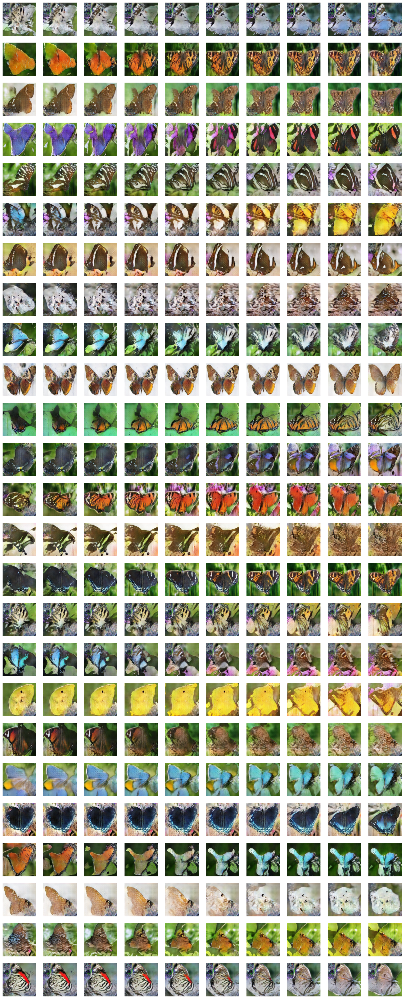

In [133]:

steps = 10 

all_interpolated_images = []

for i in range(0, 50, 2):
    z1 = random_points[i]
    z2 = random_points[i + 1] 

    # Interpolate between z1 and z2
    interpolated = interpolate_slerp(z1, z2, steps=steps)
    
    # Pass the interpolated vectors through the generator
    with torch.no_grad():
        interpolated_images = netG(interpolated)
    
    interpolated_images = [(img - img.min()) / (img.max() - img.min()) for img in interpolated_images]
    all_interpolated_images.append(interpolated_images)

fig, axs = plt.subplots(25, 10, figsize=(20, 50))

axs = axs.flatten()

for i in range(len(all_interpolated_images)):
    for j in range(len(all_interpolated_images[i])):
        img = all_interpolated_images[i][j].cpu().numpy().transpose(1, 2, 0)  # Convert to (H, W, C)
        axs[i * len(all_interpolated_images[i]) + j].imshow(img)
        axs[i * len(all_interpolated_images[i]) + j].axis('off')  

plt.show()

